I have found the following dataset: 'causes of death (4 main groups)'. <br>
These 4 main groups are: Diseases of the Heart and Vascular System, Diseases of the Respiratory System, External Causes of Death and Other Causes of Death. <br>
I want to focus on Diseases of the Respiratory System. <br>
And see if this disease (per municipality or per province, I still have to look at that) is dependent on the land use of that municipality / province. <br>
I also want to include a limited number of categories because otherwise I think there are too many. <br>
I want to look at Total Traffic Park, Residential Site, ParkEnPlantsoen, Sports Site, Total WoodsEnOpenNaturalTerrein, among other things. <br>
I tend more towards provinces, because there are a lot of municipalities or to a province with the municipalities of that province.

In [1]:
import pandas as pd
import numpy as np
import yaml #config file
import json
import matplotlib.pyplot as plt

from bokeh.models import ColumnDataSource, HoverTool, Legend, LegendItem, Title, Span, FactorRange
from bokeh.models import (BasicTicker, ColorBar, ColumnDataSource,
                          LinearColorMapper, PrintfTickFormatter,)
from bokeh.plotting import figure, show
from bokeh.transform import dodge, factor_cmap, factor_mark, transform
from bokeh.palettes import Set3, Category20, Viridis256, Plasma256
from bokeh.models.widgets import Panel, Tabs
from bokeh.layouts import row

import folium
from folium.plugins import MarkerCluster
import panel as pn
pn.extension()

import statsmodels.api as sm
from scipy.stats import iqr, mannwhitneyu, norm  # iqr is the Interquartile Range function
import seaborn as sns

import doctest

### Read data

In [2]:
def get_config():
    '''
    Reads the config file
    
    return:
        config: A dictionary with the paths of different files.
    '''
    with open("config.yaml", 'r') as con:
        config = yaml.safe_load(con)
    return config

config = get_config()

In [3]:
# Read files
#https://opendata.cbs.nl/statline/portal.html?_la=nl&_catalog=CBS&tableId=70262ned&_theme=298
df_landuse = pd.read_csv(config['path_land_use'], sep=';', engine='python')
#https://opendata.cbs.nl/statline/portal.html?_la=nl&_catalog=CBS&tableId=80142ned&_theme=289
df_deceased = pd.read_csv(config['path_deceased'], sep=';', engine='python')
#https://opendata.cbs.nl/statline/portal.html?_la=nl&_catalog=CBS&tableId=37259ned&_theme=257
df_population_development = pd.read_csv(config['path_population_development'], sep=';', engine='python')


### Filteren Data

In [4]:
def cal_percentage(pv_df, number_col, div_col):
    '''
    
    This function calculates the percentages with respect to the div_col
    
    parameters:
         pv_df: The dataframe with the data.
         number_col: The column number from which the percentage should be calculated.
         div_col: The column name of the column to divide by.
    
    return:
         percentage_df: Returns a data frame with percentages relative to div_col
    pd.DataFrame({"test1": [1 ,4, 4, 8, 6, 110, -60], "test2_percentage": [200.0 ,50.0, 200.0, 300.0, 50.0, 400.0, 150.0]}
           
    This is a test:
    >>> cal_percentage(pd.DataFrame({"test1": [1 ,4, 4, 8, 6, 110, -60], "test2": [2 ,2, 8, 24, 3, 440, -90]}), 1, 'test1')
       test1  test2_percentage
    0      1             200.0
    1      4              50.0
    2      4             200.0
    3      8             300.0
    4      6              50.0
    5    110             400.0
    6    -60             150.0

    
    
     '''
    columns_df = list(pv_df.columns)[number_col:]
    percentage_df = pv_df[pv_df.columns[:number_col]].copy()
    for name in columns_df:
        new_col_name = name + '_percentage'
        percentage_df[new_col_name] = (pv_df[name]/pv_df[div_col])* 100
    return percentage_df

In [5]:
def filter_data(df, name_cols, percentage, drop, **values_perc):
    '''
     IS DOING.....
    
     parameters:
         df: The data frame containing the data.
         name_cols: The column names to be selected or deleted.
         percentage: True or False. The percentage must be calculated.
         drop: True, if columns are to be removed. False, if there are columns to be selected.
         ** values_perc: When percentage == True, two extra values are included:
                                             number_col: The column number from which the percentage should be calculated.
                                             div_col: The column name of the column to divide by.
        
     return:
         pv_df: Returns the filtered data frame (with possibly already percentages).
         
         
    This is a test:
    >>> filter_data(pd.DataFrame({"RegioS": ['Groningen (PV)' ,'Groingen', 'Test (pv)', 'Test (PV)'], "Perioden": [2002 ,2020, 2008, 2004], "test": [2 ,2, 8, 24]}), ['test'], False, True)
               RegioS  Perioden
    0  Groningen (PV)      2002
    3       Test (PV)      2004

    
     '''
    # Delete or select columns
    if drop == False:
        select_df = df[name_cols]
    else:
        select_df = df.drop(name_cols, axis = 1)
        
    # Filter on the Regions column. Now we want all rows of provinces.
    pv_df = select_df[select_df['RegioS'].str.contains('\(PV\)')]
    
    # Checks whether the percentage should be calculated or not.
    if percentage == True:
        pv_df = cal_percentage(pv_df, values_perc['number_col'], values_perc['div_col'])
        
    return pv_df
        

In [6]:
#land
land_name_cols = ['ID', 'RegioS', 'Perioden', 'TotaleOppervlakte_1', 'TotaalVerkeersterrein_2',
          'TotaalBebouwdTerrein_6', 'Woonterrein_7', 'TotaalRecreatieterrein_19', 'ParkEnPlantsoen_20', 'Sportterrein_21',
          'TotaalAgrarischTerrein_25', 'TotaalBosEnOpenNatuurlijkTerrein_28', 'Bos_29', 'OpenDroogNatuurlijkTerrein_30', 
           'OpenNatNatuurlijkTerrein_31'
          ]
percentage_landuse = filter_data(df_landuse, land_name_cols, True, False, number_col=4, div_col = 'TotaleOppervlakte_1')

In [7]:
#Population development
#Filter on 'Men and Women'
select_population_development = df_population_development[df_population_development['Geslacht'] == 'Mannen en vrouwen']
population_name_cols = ['RegioS', 'Perioden', 
             'BevolkingOp1Januari_1', 'BevolkingOp31December_20', 'Overledenen_5']
pv_population_development = filter_data(select_population_development, population_name_cols, False, False)

In [8]:
#deceased
deceased_name_cols = ['Unnamed: 0', 'ID']
# This filtering was done after I saw that something was wrong within Check Data
# When this check is now performed in Check Data, it is correct.
df_deceased['RegioS'] = df_deceased['RegioS'].replace('FryslÃ¢n (PV)', 'Friesland (PV)')
pv_deceased = filter_data(df_deceased, deceased_name_cols, False, True)

In [9]:
#Merge pv_deceased + pv_population_development
pv_population_deceased = pd.DataFrame(pd.merge(pv_population_development, pv_deceased, on = ['RegioS','Perioden'])).reset_index()

I chose to normalize by taking the percentage relative to Population on December 31.
I was very doubtful whether this should not be done on the Population on January 1. Because the people who died were still alive then.
But in the end I chose to normalize to the Population on December 31.
This is because only the survivor is not counted, but people who have moved to the prophet or people who have just moved out of the prophesy.
Also, if you put everything through the same column, it should not ultimately yield completely different results.

In [10]:
# Calculate percentages relative to PopulationOn31December
percentage_deceased = cal_percentage(pv_population_deceased, 6, 'BevolkingOp31December_20')

Merge the Dataframes into 1 large dataframe

In [11]:
pv_deceased_landuse_perc = pd.DataFrame(pd.merge(percentage_deceased, percentage_landuse, on = ['RegioS','Perioden'])).reset_index()

In [12]:
pv_deceased_landuse_perc = pv_deceased_landuse_perc.drop(['level_0', 'index','ID',], axis=1)

In [13]:
pv_deceased_landuse_perc

,RegioS,Perioden,BevolkingOp1Januari_1,BevolkingOp31December_20,Overledenen_5,TotaalAlleOnderliggendeDoodsoorzaken_1_percentage,Nieuwvormingen_2_percentage,ZiektenVanHartEnVaatstelsel_3_percentage,ZiektenVanAdemhalingsstelsel_4_percentage,UitwendigeDoodsoorzaken_5_percentage,...,TotaalBebouwdTerrein_6_percentage,Woonterrein_7_percentage,TotaalRecreatieterrein_19_percentage,ParkEnPlantsoen_20_percentage,Sportterrein_21_percentage,TotaalAgrarischTerrein_25_percentage,TotaalBosEnOpenNatuurlijkTerrein_28_percentage,Bos_29_percentage,OpenDroogNatuurlijkTerrein_30_percentage,OpenNatNatuurlijkTerrein_31_percentage
0,Groningen (PV),1996,558113.0,558124.0,5691.0,1.019666,0.278074,0.393461,0.088690,0.035297,...,4.689780,3.411086,1.184662,0.390281,0.430725,65.621872,4.095258,2.052516,0.772811,1.269931
1,Groningen (PV),2000,562646.0,566489.0,5458.0,0.963479,0.268672,0.357995,0.087204,0.032481,...,4.903130,3.516628,1.222076,0.397588,0.447791,64.791940,4.376832,2.332963,0.777991,1.266215
2,Groningen (PV),2003,572997.0,574384.0,5552.0,0.966601,0.269680,0.341235,0.089835,0.041958,...,5.080360,3.540214,1.236228,0.424206,0.452509,64.167593,4.881566,2.561070,0.769905,1.550254
3,Groningen (PV),2006,574042.0,573614.0,5258.0,0.916644,0.271088,0.285907,0.089956,0.035215,...,5.238123,3.591855,1.263163,0.442901,0.459455,63.790232,4.807046,2.546934,0.739857,1.520255
4,Groningen (PV),2008,573459.0,574092.0,5278.0,0.919365,0.278004,0.287236,0.093887,0.033967,...,5.307716,3.623274,1.291541,0.463171,0.485468,63.627734,4.836437,2.559771,0.794249,1.482080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,Limburg (PV),2006,1131938.0,1127805.0,10491.0,0.930214,0.275491,0.296771,0.084234,0.033605,...,12.836657,8.829361,3.031839,0.768144,1.233014,60.050606,15.913309,14.450802,1.056029,0.406931
92,Limburg (PV),2008,1123705.0,1122604.0,10578.0,0.942273,0.293425,0.286566,0.098966,0.038304,...,13.228651,8.947954,3.170350,0.817483,1.279637,59.862757,15.916930,14.404179,1.069608,0.442690
93,Limburg (PV),2010,1122701.0,1122627.0,10690.0,0.952231,0.293508,0.281750,0.098252,0.038392,...,13.437774,8.985524,3.204751,0.863201,1.274205,59.331800,16.083052,14.584333,1.061461,0.437258
94,Limburg (PV),2012,1123075.0,1121891.0,10991.0,0.979685,0.303238,0.286124,0.113558,0.039398,...,13.478615,8.997511,3.267708,0.893867,1.266802,58.907898,16.180584,14.553971,1.174926,0.451233


# Check data
* Check Datatypes
* Missing values
* Make sure that every province has the same years

In [14]:
# Check the datatypes of the dataframe
pv_deceased_landuse_perc.dtypes

RegioS                                                object
Perioden                                               int64
BevolkingOp1Januari_1                                float64
BevolkingOp31December_20                             float64
Overledenen_5                                        float64
TotaalAlleOnderliggendeDoodsoorzaken_1_percentage    float64
Nieuwvormingen_2_percentage                          float64
ZiektenVanHartEnVaatstelsel_3_percentage             float64
ZiektenVanAdemhalingsstelsel_4_percentage            float64
UitwendigeDoodsoorzaken_5_percentage                 float64
OverigeDoodsoorzaken_6_percentage                    float64
TotaleOppervlakte_1                                  float64
TotaalVerkeersterrein_2_percentage                   float64
TotaalBebouwdTerrein_6_percentage                    float64
Woonterrein_7_percentage                             float64
TotaalRecreatieterrein_19_percentage                 float64
ParkEnPlantsoen_20_perce

The data types are good in my opinion.

In [15]:
# missing data
percent_missing = pv_deceased_landuse_perc.isnull().sum() * 100 / len(pv_deceased_landuse_perc)
percent_missing

RegioS                                               0.0
Perioden                                             0.0
BevolkingOp1Januari_1                                0.0
BevolkingOp31December_20                             0.0
Overledenen_5                                        0.0
TotaalAlleOnderliggendeDoodsoorzaken_1_percentage    0.0
Nieuwvormingen_2_percentage                          0.0
ZiektenVanHartEnVaatstelsel_3_percentage             0.0
ZiektenVanAdemhalingsstelsel_4_percentage            0.0
UitwendigeDoodsoorzaken_5_percentage                 0.0
OverigeDoodsoorzaken_6_percentage                    0.0
TotaleOppervlakte_1                                  0.0
TotaalVerkeersterrein_2_percentage                   0.0
TotaalBebouwdTerrein_6_percentage                    0.0
Woonterrein_7_percentage                             0.0
TotaalRecreatieterrein_19_percentage                 0.0
ParkEnPlantsoen_20_percentage                        0.0
Sportterrein_21_percentage     

There are no missing values in the dataframe.

In [16]:
# Check whether the years all occur 12 times (NL has 12 provinces).
df_dict = dict()
for i in pv_deceased_landuse_perc.columns:
    counts = pv_deceased_landuse_perc[i].value_counts().to_dict()
    df_dict[i] = counts
    
df_dict['Perioden']

{2015: 12,
 2012: 12,
 2010: 12,
 2008: 12,
 2006: 12,
 2003: 12,
 2000: 12,
 1996: 12}

Everything happens 11 times.
To check this, it is checked how many provinces are present in the data frame.

In [17]:
all_provinces = set(pv_deceased_landuse_perc['RegioS'])
print(len(all_provinces))
print(all_provinces)

12
{'Zeeland (PV)', 'Groningen (PV)', 'Noord-Brabant (PV)', 'Overijssel (PV)', 'Noord-Holland (PV)', 'Friesland (PV)', 'Zuid-Holland (PV)', 'Gelderland (PV)', 'Flevoland (PV)', 'Utrecht (PV)', 'Drenthe (PV)', 'Limburg (PV)'}


When the data was checked, it can be seen that Friesland is missing, this is because it is written differently in the deceased_df, namely: 'FryslÃ¢n (PV)' instead of 'Friesland (PV)'. This discovery has been adapted above. This is therefore no longer visible when this code is run.

In [18]:
pv_deceased_landuse_perc.describe()

,Perioden,BevolkingOp1Januari_1,BevolkingOp31December_20,Overledenen_5,TotaalAlleOnderliggendeDoodsoorzaken_1_percentage,Nieuwvormingen_2_percentage,ZiektenVanHartEnVaatstelsel_3_percentage,ZiektenVanAdemhalingsstelsel_4_percentage,UitwendigeDoodsoorzaken_5_percentage,OverigeDoodsoorzaken_6_percentage,...,TotaalBebouwdTerrein_6_percentage,Woonterrein_7_percentage,TotaalRecreatieterrein_19_percentage,ParkEnPlantsoen_20_percentage,Sportterrein_21_percentage,TotaalAgrarischTerrein_25_percentage,TotaalBosEnOpenNatuurlijkTerrein_28_percentage,Bos_29_percentage,OpenDroogNatuurlijkTerrein_30_percentage,OpenNatNatuurlijkTerrein_31_percentage
count,96.000000,9.600000e+01,9.600000e+01,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,...,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,2006.250000,1.359334e+06,1.365318e+06,11609.760417,0.855305,0.256100,0.268630,0.083177,0.034782,0.212616,...,8.447323,5.692663,2.403350,0.695241,0.839822,55.664794,11.532207,8.388398,1.874626,1.269159
std,5.963044,9.864140e+05,9.910060e+05,8330.371329,0.120156,0.034793,0.054260,0.012833,0.004846,0.037332,...,4.433888,2.933499,1.059385,0.444809,0.409170,10.380589,5.549744,5.789379,1.093737,0.671838
min,1996.000000,2.728430e+05,2.814720e+05,1493.000000,0.513497,0.152413,0.139795,0.043699,0.022428,0.108714,...,2.393566,1.654438,0.762968,0.129948,0.278710,38.360383,4.079266,1.179099,0.159184,0.237515
25%,2002.250000,5.413300e+05,5.414458e+05,5187.250000,0.813521,0.245432,0.235219,0.078693,0.031944,0.194148,...,4.519439,3.172099,1.582402,0.386259,0.466039,46.603072,6.661309,2.354549,1.042702,0.749352
50%,2007.000000,1.121348e+06,1.122248e+06,9196.500000,0.880655,0.258381,0.275440,0.085001,0.034079,0.215258,...,7.733035,5.256879,2.208567,0.565710,0.748449,58.306660,11.546027,8.741451,1.311704,1.268073
75%,2010.500000,2.092540e+06,2.102537e+06,18025.000000,0.934795,0.277377,0.300103,0.090564,0.037215,0.235282,...,12.019978,7.948504,3.220490,0.894835,1.176846,63.225848,16.084775,13.227969,2.699495,1.786250
max,2015.000000,3.600011e+06,3.622303e+06,31051.000000,1.058356,0.322864,0.393461,0.113558,0.049526,0.315277,...,16.758317,10.596703,4.983357,1.996326,1.590032,73.555954,22.548189,18.585577,3.961412,2.578117


# Create some plots

## Stacked and grouped barplot

In [19]:
# All the categorys
cat_all = ['TotaalVerkeersterrein_2_percentage',
      'TotaalBebouwdTerrein_6_percentage', 'Woonterrein_7_percentage', 'TotaalRecreatieterrein_19_percentage', 'ParkEnPlantsoen_20_percentage', 'Sportterrein_21_percentage',
      'TotaalAgrarischTerrein_25_percentage', 'TotaalBosEnOpenNatuurlijkTerrein_28_percentage', 'Bos_29_percentage', 'OpenDroogNatuurlijkTerrein_30_percentage', 
       'OpenNatNatuurlijkTerrein_31_percentage',
      'TotaalAlleOnderliggendeDoodsoorzaken_1_percentage', 'Nieuwvormingen_2_percentage', 'ZiektenVanHartEnVaatstelsel_3_percentage', 'ZiektenVanAdemhalingsstelsel_4_percentage', 'UitwendigeDoodsoorzaken_5_percentage', 'OverigeDoodsoorzaken_6_percentage']
cat_land = ['TotaalVerkeersterrein_2_percentage',
              'TotaalBebouwdTerrein_6_percentage', 'Woonterrein_7_percentage', 'TotaalRecreatieterrein_19_percentage', 'ParkEnPlantsoen_20_percentage', 'Sportterrein_21_percentage',
              'TotaalAgrarischTerrein_25_percentage', 'TotaalBosEnOpenNatuurlijkTerrein_28_percentage', 'Bos_29_percentage', 'OpenDroogNatuurlijkTerrein_30_percentage', 
               'OpenNatNatuurlijkTerrein_31_percentage']
cat_deceased = ['TotaalAlleOnderliggendeDoodsoorzaken_1_percentage', 'Nieuwvormingen_2_percentage', 'ZiektenVanHartEnVaatstelsel_3_percentage', 'ZiektenVanAdemhalingsstelsel_4_percentage', 'UitwendigeDoodsoorzaken_5_percentage', 'OverigeDoodsoorzaken_6_percentage']


In [20]:
def make_bar_stack_group(df, groups, color, region_per):
    '''
    DOEN
    
    parameters:
        df:
        groups:
        color:
        region_per:
    
    return:
        factors:
        data:
        col_pallet:
        
    #pv_deceased_landuse_perc, cat_deceased, Set3, True
        
    This is a test:
    >>> make_bar_stack_group(pd.DataFrame({"RegioS": ['Groningen (PV)' ,'Groingen (PV)', 'Gelderland (pv)', 'Gelderland (PV)'], "Perioden": [2002 ,2020, 2008, 2004], "a": [2 ,2, 8, 24], "b": [1,2,3,4], "c": [5,6,7,8], "d": [5,6,7,8]}), ['a', 'b', 'c'], Set3, True)
    ([('Groningen (PV)', '2002'), ('Groingen (PV)', '2020'), ('Gelderland (pv)', '2008'), ('Gelderland (PV)', '2004')], {'x': [('Groningen (PV)', '2002'), ('Groingen (PV)', '2020'), ('Gelderland (pv)', '2008'), ('Gelderland (PV)', '2004')], 'a': [2, 2, 8, 24], 'b': [1, 2, 3, 4], 'c': [5, 6, 7, 8]}, ('#8dd3c7', '#ffffb3', '#bebada'))
    '''
    data = {}
    factors = []
    for index, row in df.iterrows():
        if region_per == True:
            factors.append((row['RegioS'], str(row['Perioden'])))
        else:
            factors.append((str(row['Perioden']), row['RegioS']))
    data['x'] = factors
    for name in groups:
        data[f'{name}'] = list(df[name])
    return factors, data, color[len(groups)]

In [21]:
def stracked_and_grouped_bar(source, groups, factors, color, width, height, title, label, sub_title):
    '''
    DOEN
    
    parameters:
        source:
        groups:
        factors:
        color:
        width:
        height:
        title:
        
    return:
        p:
    '''
    p = figure(x_range=FactorRange(*factors), plot_height=height, plot_width=width,
           toolbar_location=None, tools="", x_axis_label = 'Year and province', y_axis_label='Percentage')
    p.add_layout(Title(text=sub_title, text_font_size="8pt", text_font_style="italic"), 'above')
    p.add_layout(Title(text=title, text_font_size="10pt"), 'above')
        
    p.vbar_stack(groups, x='x', width=0.8, alpha=0.8, color=color, source=source,
                 legend_label=[x.split('_')[0] for x in groups])
    
    p.x_range.range_padding = 0.01
    p.xaxis.major_label_orientation = 1
    p.xgrid.grid_line_color = None

    # Legend
    new_legend = p.legend[0]
    p.add_layout(new_legend, 'right') 
    p.legend.orientation = "vertical" 
    p.xaxis.major_label_orientation = "vertical"
    
    # Hover
    tips = [
        (label, f"@x")
    ]
    for name in groups:
        new_name = name.split('_')[0]
        tips.append( (new_name, f'@{name} %') )
        
    p.add_tools(HoverTool( tooltips = tips
                            ))
    return p

In [22]:
# region periods, deceased
factors, data, color_pal = make_bar_stack_group(pv_deceased_landuse_perc, cat_deceased, Set3, True)
source_bar_deceased_region = ColumnDataSource(data=data)
stacked_grouped_deceased_reg_per = stracked_and_grouped_bar(source_bar_deceased_region, cat_deceased, factors, color_pal, 1500, 250,
                            'Percentage of various underlying causes of death per province per year', "Province-year", 'Percentage compared to the total number of inhabitants in that province')

In [23]:
show(stacked_grouped_deceased_reg_per)

In [24]:
# periods Region, deceased
factors, data, color_pal = make_bar_stack_group(pv_deceased_landuse_perc, cat_deceased, Set3, False)
source_bar_deceased_per = ColumnDataSource(data=data)
stacked_grouped_deceased_per_reg = stracked_and_grouped_bar(source_bar_deceased_per, cat_deceased, factors, color_pal, 2500, 400,
                            'Percentage of various underlying causes of death per year by province', "Year-province", 'Percentage compared to the total number of inhabitants in that province')

In [25]:
show(stacked_grouped_deceased_per_reg)

In [26]:
# Region periods, land
factors, data, color_pal = make_bar_stack_group(pv_deceased_landuse_perc, cat_land, Set3, True)
source_bar_land_region = ColumnDataSource(data=data)
stacked_grouped_land_reg_per = stracked_and_grouped_bar(source_bar_land_region, cat_land, factors, color_pal, 2500, 500,
                            'Percentage of land use per province per year', "Province-year", 'Percentage in relation to the total area of that province')

In [27]:
show(stacked_grouped_land_reg_per)

In [28]:
# periods region, land
factors, data, color_pal = make_bar_stack_group(pv_deceased_landuse_perc, cat_land, Set3, False)
source_bar_land_per = ColumnDataSource(data=data)
stacked_grouped_land_per_reg = stracked_and_grouped_bar(source_bar_land_per, cat_land, factors, color_pal, 2500, 500,
                            'Percentage of land use per year per province',"Year-province", 'Percentage in relation to the total area of that province')

In [29]:
show(stacked_grouped_land_per_reg)

# Heatmap

In [30]:
def heatmap(df, palette):
    '''
    DOEN
    
    parameters:
        df:
        palette:
    
    return:
        p:
    '''
    cor = df.corr().abs()
    y_range = (list(reversed(cor.columns)))
    x_range = (list(cor.index))

    dfc = pd.DataFrame(cor.stack(), columns=['r']).reset_index()
    source = ColumnDataSource(dfc)   

    #create colormapper 
    mapper = LinearColorMapper(palette=Viridis256, low=dfc.r.min(), high=dfc.r.max())
    #create plot
    p = figure(title="Correlation heatmap", plot_width=800, plot_height=800,
               x_range=x_range, y_range=y_range, x_axis_location="above", toolbar_location=None)
    #use mapper to fill the rectangles in the plot
    p.rect(x="level_0", y="level_1", width=1, height=1, source=source,
           line_color=None, fill_color=transform('r', mapper))
    #create and add colorbar to the right
    color_bar = ColorBar(color_mapper=mapper, location=(0, 0),
                         ticker=BasicTicker(desired_num_ticks=len(x_range)), 
                         formatter=PrintfTickFormatter(format="%.1f"))
    p.add_layout(color_bar, 'right')

    #draw axis
    p.axis.axis_line_color = None
    p.axis.major_tick_line_color = None
    p.axis.major_label_text_font_size = "10px"
    p.axis.major_label_standoff = 0
    p.xaxis.major_label_orientation = 1.0

    return p

In [31]:
heatmap_pv_deceased_landuse_perc = heatmap(pv_deceased_landuse_perc, Plasma256)
show(heatmap_pv_deceased_landuse_perc)

# Boxplot

In [32]:
def boxplot_fun(df, value, by): 
    '''
    DOEN
    
    parameters:
        df:
        value:
        by:
    
    return:
        p:
    '''
    
    if isinstance(by, str):
        label = by
        df[by] = df[by].astype(str).copy()
        df[[by, value]].copy()
        cats = sorted(df[by].unique())
        groups = df.groupby(by)
    else:
        label = by[0]+'-'+by[1]
        df[[by[0], by[1], value]].copy()
        df['group'] = df[by[0]].astype(str) + "-" + df[by[1]].astype(str)
        cats = sorted(df['group'].unique())
        groups = df.groupby('group')

    q1 = groups.quantile(q=0.25)
    q2 = groups.quantile(q=0.5)
    q3 = groups.quantile(q=0.75)
    iqr = q3 - q1
    upper = q3 + 1.5*iqr
    lower = q1 - 1.5*iqr

    # find the outliers for each category
    def outliers(group):
        cat = group.name
        return group[(group[value] > upper.loc[cat][value]) | (group[value] < lower.loc[cat][value])][value]
    out = groups.apply(outliers).dropna()

    # prepare outlier data for plotting, we need coordinates for every outlier.
    if not out.empty:
        outx = []
        outy = []
        for keys in out.index:
            outx.append(keys[0])
            outy.append(out.loc[keys[0]].loc[keys[1]])

    p = figure(tools="", background_fill_color="#efefef", x_range=cats, toolbar_location=None,
              y_axis_label=f'{value.split("_")[0]} percentage', x_axis_label=label)
    p.add_layout(Title(text=f'Box plot by {label} for {value.split("_")[0]}', text_font_size="10pt"), 'above')
   
    # if no outliers, shrink lengths of stems to be no longer than the minimums or maximums
    qmin = groups.quantile(q=0.00)
    qmax = groups.quantile(q=1.00)
    upper[value] = [min([x,y]) for (x,y) in zip(list(qmax.loc[:,value]),upper[value])]
    lower[value] = [max([x,y]) for (x,y) in zip(list(qmin.loc[:,value]),lower[value])]

    # stems
    p.segment(cats, upper[value], cats, q3[value], line_color="black")
    p.segment(cats, lower[value], cats, q1[value], line_color="black")
    
    # boxes
    p.vbar(cats, 0.7, q2[value], q3[value], fill_color="skyblue", line_color="black")
    p.vbar(cats, 0.7, q1[value], q2[value], fill_color="skyblue", line_color="black")
    
    different = max(upper[value]) - min(lower[value])
    if different > 5:
        height = 0.006
    elif different > 1.0:
        height = 0.001
    elif different > 0.05:
        height = 0.00001
    else:
        height = 0.000005
    # whiskers (almost-0 height rects simpler than segments)
    p.rect(cats, lower[value], 0.2, height, line_color="black")
    p.rect(cats, upper[value], 0.2, height, line_color="black")

    # outliers
    if not out.empty:
        p.circle(outx, outy, size=6, color="deeppink", fill_alpha=0.6)

    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = "white"
    p.grid.grid_line_width = 2
    p.xaxis.major_label_text_font_size="10px"
    p.xaxis.major_label_orientation = "vertical"
    return p

In [33]:
def data_box(df, col):
    '''
    DOEN
    
    parameters:
        df:
        col:
    
    return:
        box_all:
    '''
    tabs = []
    for cat in cat_all:
        box = boxplot_fun(df, cat, col)
        tabs.append(Panel(child=box, title=str(cat.split('_')[0])))
    box_all = Tabs(tabs=tabs)
    return box_all
    

In [34]:
box_per = data_box(pv_deceased_landuse_perc, 'Perioden')

In [35]:
show(box_per)

In [36]:
box_region = data_box(pv_deceased_landuse_perc, 'RegioS')

In [37]:
show(box_region)

In [38]:
box_region_per = data_box(pv_deceased_landuse_perc, ['RegioS', 'Perioden'])

In [39]:
show(box_region_per)

# Normal distribution (QQ-plot / Histogram)

In [40]:
def cal_qq_and_histogram(y, histogram):
    """
    
    
    
    
    This is a test:
    >>> cal_qq_and_histogram([1, 20, 34, 56, 3, 8, 99], True)
    (31.571428571428573, 1084.2448979591838, 32.92787417916899, array([  0.75 ,   1.365,   1.98 ,   2.595,   3.21 ,   3.825,   4.44 ,
             5.055,   5.67 ,   6.285,   6.9  ,   7.515,   8.13 ,   8.745,
             9.36 ,   9.975,  10.59 ,  11.205,  11.82 ,  12.435,  13.05 ,
            13.665,  14.28 ,  14.895,  15.51 ,  16.125,  16.74 ,  17.355,
            17.97 ,  18.585,  19.2  ,  19.815,  20.43 ,  21.045,  21.66 ,
            22.275,  22.89 ,  23.505,  24.12 ,  24.735,  25.35 ,  25.965,
            26.58 ,  27.195,  27.81 ,  28.425,  29.04 ,  29.655,  30.27 ,
            30.885,  31.5  ,  32.115,  32.73 ,  33.345,  33.96 ,  34.575,
            35.19 ,  35.805,  36.42 ,  37.035,  37.65 ,  38.265,  38.88 ,
            39.495,  40.11 ,  40.725,  41.34 ,  41.955,  42.57 ,  43.185,
            43.8  ,  44.415,  45.03 ,  45.645,  46.26 ,  46.875,  47.49 ,
            48.105,  48.72 ,  49.335,  49.95 ,  50.565,  51.18 ,  51.795,
            52.41 ,  53.025,  53.64 ,  54.255,  54.87 ,  55.485,  56.1  ,
            56.715,  57.33 ,  57.945,  58.56 ,  59.175,  59.79 ,  60.405,
            61.02 ,  61.635,  62.25 ,  62.865,  63.48 ,  64.095,  64.71 ,
            65.325,  65.94 ,  66.555,  67.17 ,  67.785,  68.4  ,  69.015,
            69.63 ,  70.245,  70.86 ,  71.475,  72.09 ,  72.705,  73.32 ,
            73.935,  74.55 ,  75.165,  75.78 ,  76.395,  77.01 ,  77.625,
            78.24 ,  78.855,  79.47 ,  80.085,  80.7  ,  81.315,  81.93 ,
            82.545,  83.16 ,  83.775,  84.39 ,  85.005,  85.62 ,  86.235,
            86.85 ,  87.465,  88.08 ,  88.695,  89.31 ,  89.925,  90.54 ,
            91.155,  91.77 ,  92.385,  93.   ,  93.615,  94.23 ,  94.845,
            95.46 ,  96.075,  96.69 ,  97.305,  97.92 ,  98.535,  99.15 ,
            99.765, 100.38 , 100.995, 101.61 , 102.225, 102.84 , 103.455,
           104.07 , 104.685, 105.3  , 105.915, 106.53 , 107.145, 107.76 ,
           108.375, 108.99 , 109.605, 110.22 , 110.835, 111.45 , 112.065,
           112.68 , 113.295, 113.91 , 114.525, 115.14 , 115.755, 116.37 ,
           116.985, 117.6  , 118.215, 118.83 , 119.445, 120.06 , 120.675,
           121.29 , 121.905, 122.52 , 123.135, 123.75 ]), array([0.00781795, 0.00795444, 0.00809049, 0.008226  , 0.00836086,
           0.00849497, 0.00862822, 0.0087605 , 0.0088917 , 0.00902173,
           0.00915046, 0.0092778 , 0.00940362, 0.00952783, 0.00965031,
           0.00977095, 0.00988966, 0.01000631, 0.01012081, 0.01023305,
           0.01034292, 0.01045033, 0.01055517, 0.01065735, 0.01075676,
           0.01085331, 0.01094691, 0.01103747, 0.01112489, 0.01120909,
           0.01129   , 0.01136752, 0.01144158, 0.01151211, 0.01157903,
           0.01164228, 0.01170179, 0.0117575 , 0.01180936, 0.01185731,
           0.0119013 , 0.01194129, 0.01197724, 0.0120091 , 0.01203685,
           0.01206045, 0.01207989, 0.01209514, 0.01210618, 0.01211301,
           0.01211561, 0.01211399, 0.01210814, 0.01209808, 0.01208381,
           0.01206534, 0.0120427 , 0.01201591, 0.011985  , 0.01195   ,
           0.01191095, 0.01186788, 0.01182085, 0.01176989, 0.01171507,
           0.01165644, 0.01159405, 0.01152797, 0.01145828, 0.01138503,
           0.01130831, 0.01122818, 0.01114474, 0.01105806, 0.01096822,
           0.01087532, 0.01077945, 0.01068069, 0.01057915, 0.01047492,
           0.0103681 , 0.01025879, 0.01014709, 0.0100331 , 0.00991694,
           0.0097987 , 0.0096785 , 0.00955644, 0.00943262, 0.00930716,
           0.00918017, 0.00905175, 0.00892202, 0.00879107, 0.00865903,
           0.008526  , 0.00839208, 0.00825739, 0.00812202, 0.00798609,
           0.00784969, 0.00771293, 0.00757591, 0.00743873, 0.00730149,
           0.00716428, 0.00702719, 0.00689032, 0.00675377, 0.00661761,
           0.00648193, 0.00634682, 0.00621236, 0.00607863, 0.00594571,
           0.00581366, 0.00568256, 0.00555248, 0.00542348, 0.00529564,
           0.005169  , 0.00504364, 0.00491959, 0.00479693, 0.00467569,
           0.00455593, 0.00443768, 0.004321  , 0.00420592, 0.00409247,
           0.0039807 , 0.00387063, 0.00376228, 0.0036557 , 0.0035509 ,
           0.0034479 , 0.00334671, 0.00324737, 0.00314987, 0.00305424,
           0.00296048, 0.00286859, 0.00277859, 0.00269047, 0.00260424,
           0.00251989, 0.00243743, 0.00235684, 0.00227812, 0.00220126,
           0.00212625, 0.00205308, 0.00198174, 0.00191221, 0.00184448,
           0.00177852, 0.00171433, 0.00165188, 0.00159114, 0.00153211,
           0.00147475, 0.00141904, 0.00136496, 0.00131248, 0.00126159,
           0.00121224, 0.00116441, 0.00111809, 0.00107323, 0.00102981,
           0.0009878 , 0.00094718, 0.00090791, 0.00086997, 0.00083332,
           0.00079793, 0.00076378, 0.00073084, 0.00069908, 0.00066846,
           0.00063896, 0.00061055, 0.0005832 , 0.00055688, 0.00053156,
           0.00050722, 0.00048382, 0.00046134, 0.00043975, 0.00041903,
           0.00039914, 0.00038007, 0.00036178, 0.00034425, 0.00032745,
           0.00031137, 0.00029597, 0.00028124, 0.00026714, 0.00025367,
           0.00024079]))
           
    This is a test:
    >>> cal_qq_and_histogram([1, 20, 34, 56, 3, 8, 99], False)
    (31.571428571428573, 1084.2448979591838, 32.92787417916899, 1264.9523809523812, 35.5661690508323, 20.0, 29.28094885100074, 7)

 
    """
    Y = np.array(y)
    # Estimates of mu and sigma:
    mu = np.mean(Y)
    sigma2 = np.mean((Y- mu)**2)
    sigma = np.sqrt(sigma2) # biased estimate
    
    if histogram == True:
        mini = min(y) - (min(y)*0.25)
        maxi = max(y) + (max(y)*0.25)

        x = np.linspace(mini, maxi, 201)

        rv = np.array([norm.pdf(xi, loc = mu, scale = sigma) for xi in x])
        return mu, sigma2, sigma, x, rv
    else:
        n = len(y)
        s2 = n/(n-1) * sigma2
        s = np.sqrt(s2) # unbiased estimate
        # Robust estimates:
        mu_R = np.median(y)
        sigma_R = iqr(y)/1.349
        return mu, sigma2, sigma, s2, s, mu_R, sigma_R, n
    
    
    
    

In [41]:
def Q_Q_Plot(df, cat, est = 'robust', **kwargs):
    
    ################################################################################
    #
    # Arguments:
    #
    # y                  data array
    # est                Estimation method for normal parameters mu and sigma:
    #                    either 'robust' (default), or 'ML' (Maximum Likelihood),
    #                    or 'preset' (given values)
    # If est='preset' than the optional parameters mu, sigma must be provided
    #
    # Author:            M.E.F. Apol 
    # Date:              2020-01-06
    #
    ################################################################################
    
    
    
    # First, get the optional arguments mu and sigma:
    mu_0 = kwargs.get('mu', None)
    sigma_0 = kwargs.get('sigma', None)
    
    y = df[cat]
    
    # Calculate order statistic:
    y_os = np.sort(y)
    
    mu_ML, sigma2_ML, sigma_ML, s2, s, mu_R, sigma_R, n = cal_qq_and_histogram(y, False)

    # Assign values of mu and sigma for z-transform:
    if est == 'ML':
        mu, sigma = mu_ML, s
    elif est == 'robust':
        mu, sigma = mu_R, sigma_R
    elif est == 'preset':
        mu, sigma = mu_0, sigma_0
    else:
        print('Wrong estimation method chosen!')
        
    # Perform z-transform: sample quantiles z.i
    z_i = (y_os - mu)/sigma

    # Calculate cumulative probabilities p.i:
    i = np.array(range(n)) + 1
    p_i = (i - 0.5)/n

    # Calculate theoretical quantiles z.(i):
    
    z_th = norm.ppf(p_i, 0, 1)

    # Calculate SE or theoretical quantiles:
    SE_z_th = (1/norm.pdf(z_th, 0, 1)) * np.sqrt((p_i * (1 - p_i)) / n)

    # Calculate 95% CI of diagonal line:
    CI_upper = z_th + 1.96 * SE_z_th
    CI_lower = z_th - 1.96 * SE_z_th

    # Make Q-Q plot:
    fig = plt.figure()
    plt.plot(z_th, z_i, 'o', color='k', label='experimental data')
    plt.plot(z_th, z_th, '--', color='r', label='normal line')
    plt.plot(z_th, CI_upper, '--', color='b', label='95% CI')
    plt.plot(z_th, CI_lower, '--', color='b')
    plt.xlabel('Theoretical quantiles, $z_{(i)}$')
    plt.ylabel('Sample quantiles, $z_i$')
    plt.title(f'Q-Q plot ({est}) - {cat.split("_")[0]}')
    plt.legend(loc='best')
    plt.close(fig)
    return(fig)

In [42]:
def qq_data(df, category):
    qq = pn.Tabs()
    for cat in category:
        qq.append((f'{cat.split("_")[0]}', pn.Row(Q_Q_Plot(df, cat, est='ML'),
                                                  Q_Q_Plot(df, cat, est='robust'))))
    return qq

Tabs
    [0] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [1] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [2] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [3] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [4] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [5] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [6] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [7] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [8] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [9] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [10] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [11] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [12] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [13] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [14] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [15] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
    [16] Row
        [0] Matplotlib(Figure)
        [1] Matplotlib(Figure)
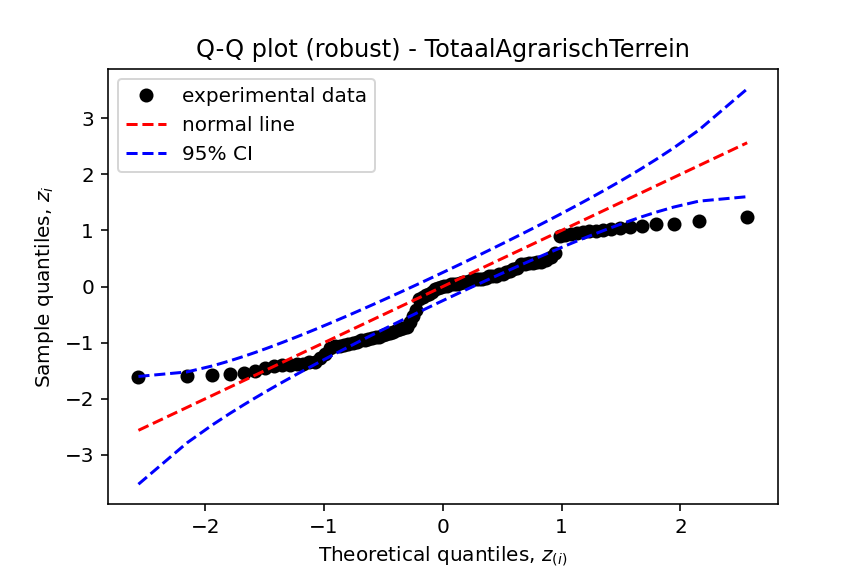
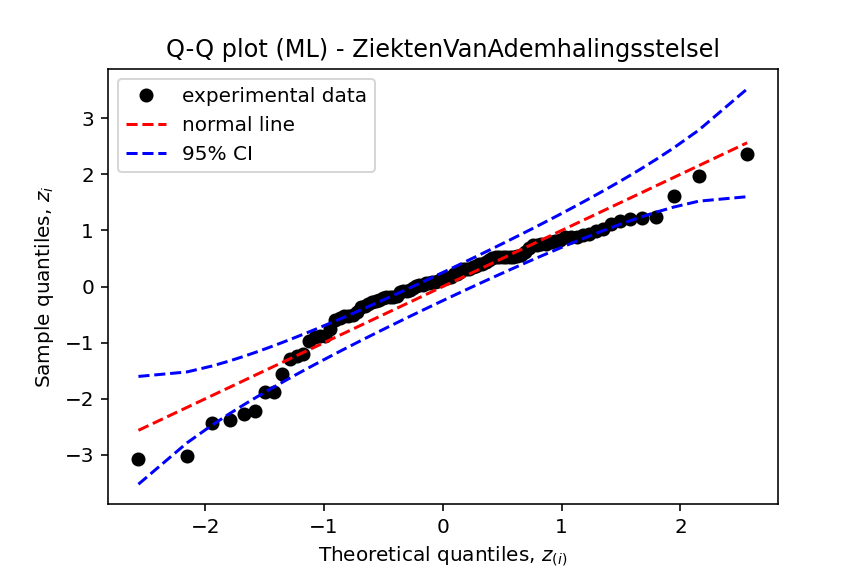
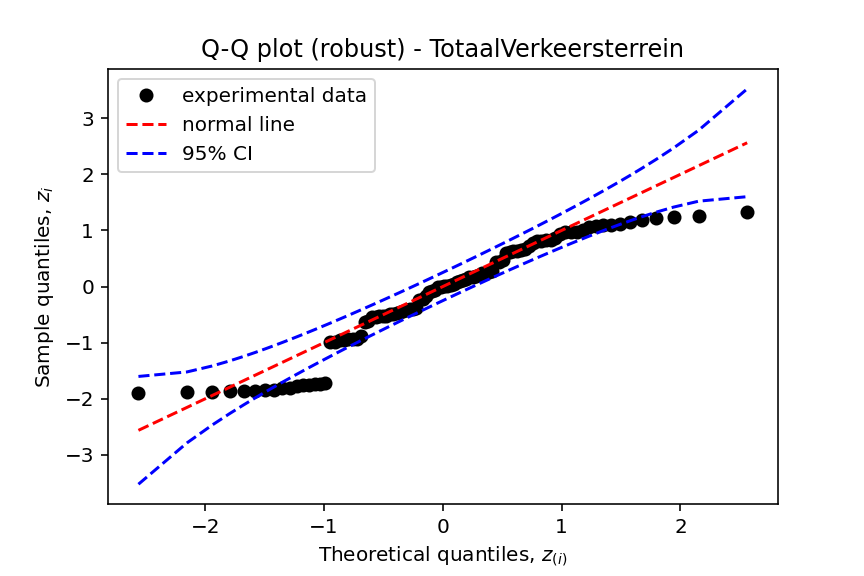
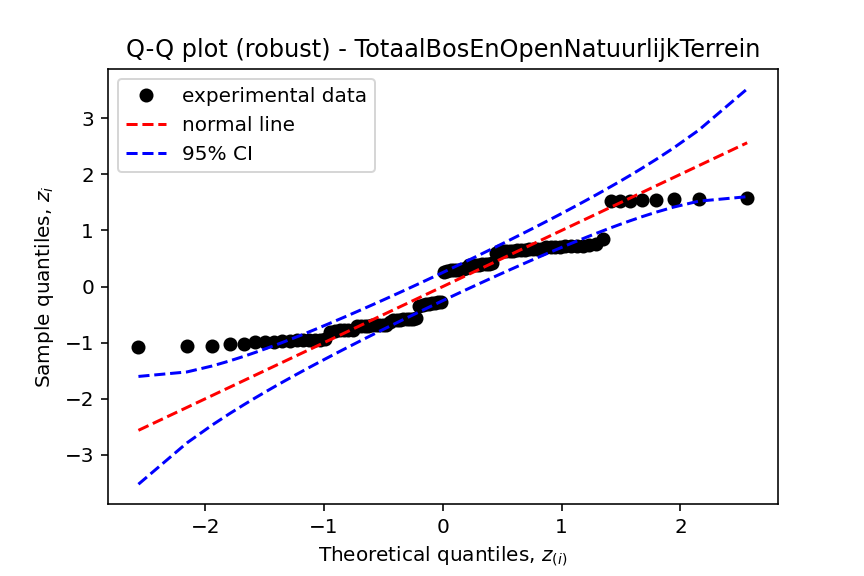
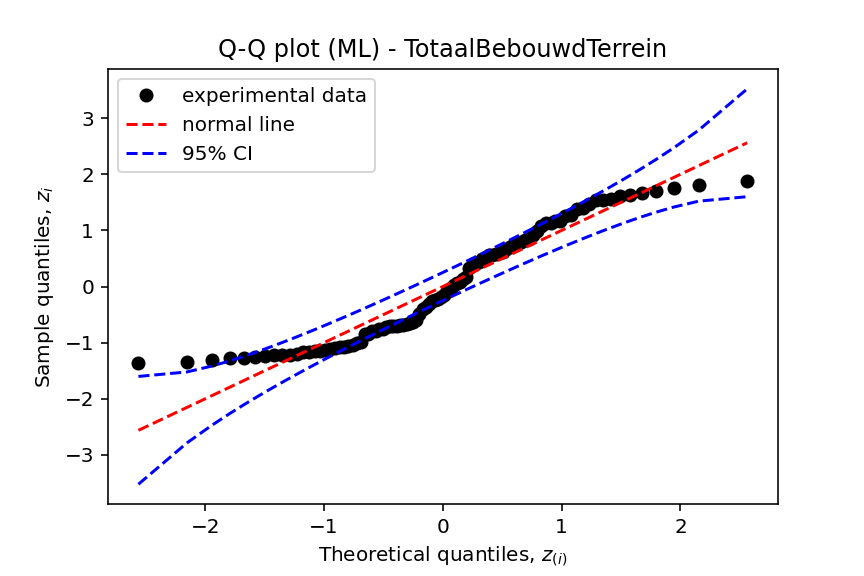
...
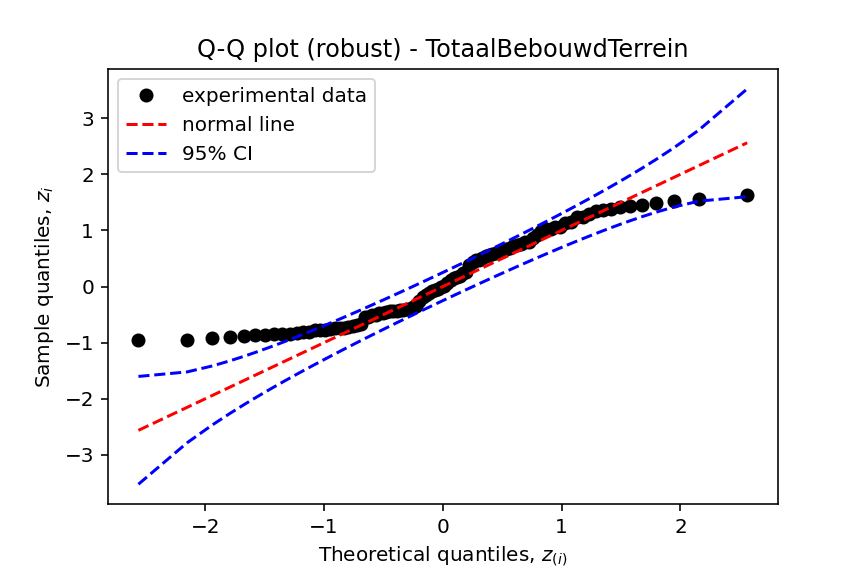
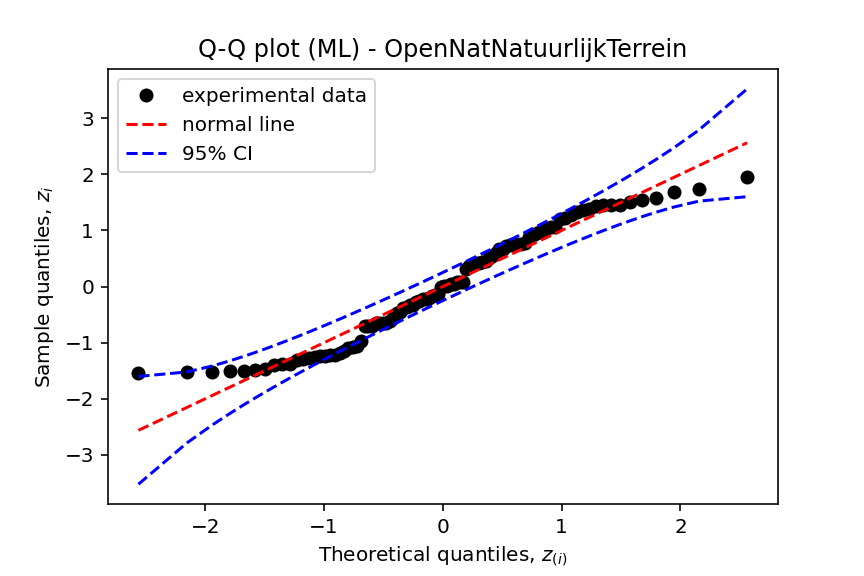
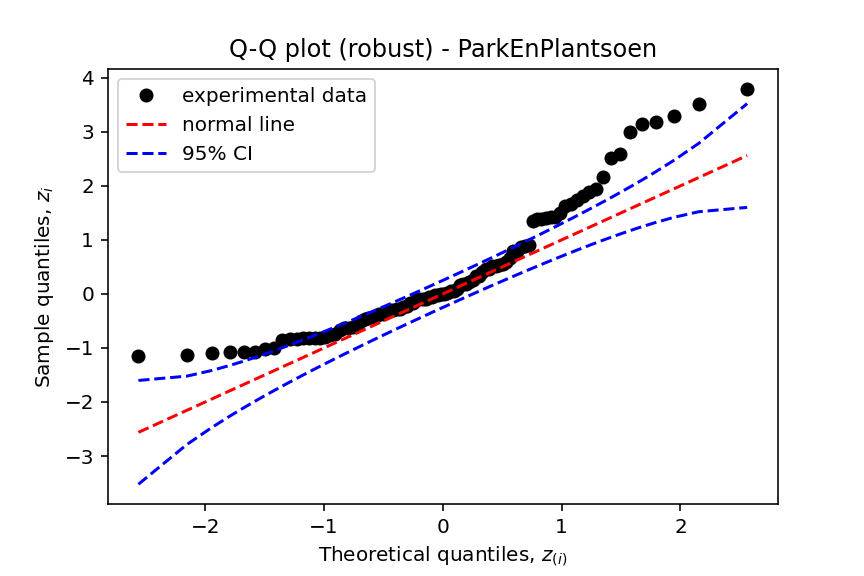
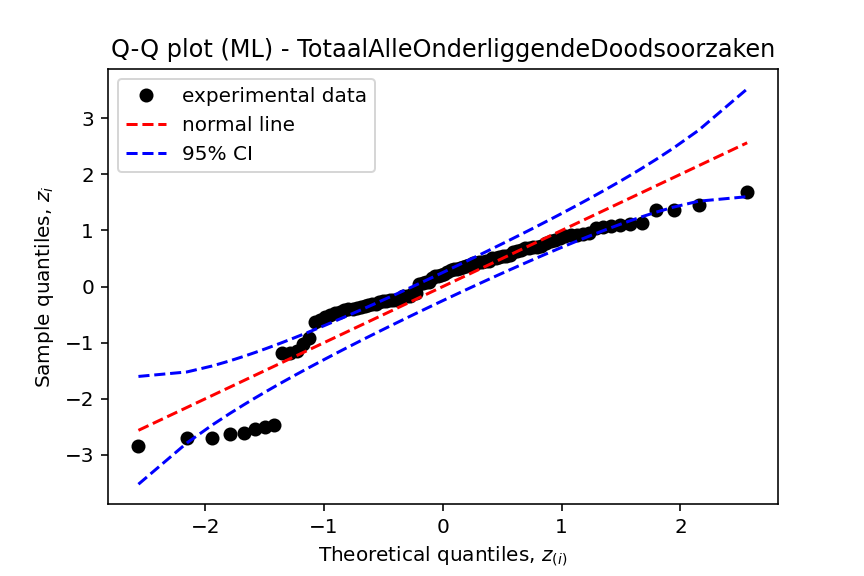
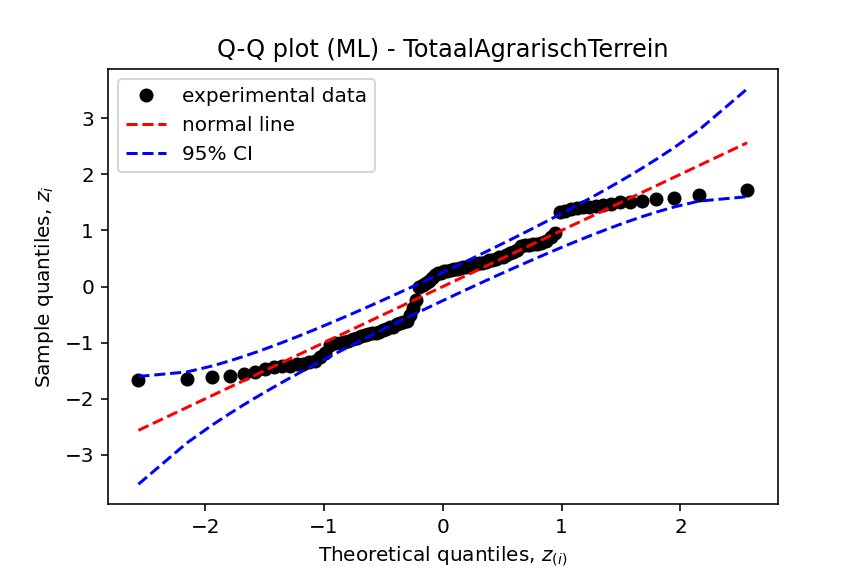

In [43]:
qq_plots = qq_data(pv_deceased_landuse_perc, cat_all)
qq_plots

In [44]:
def make_plot_normal_distribution(title, df, col, sub):
    '''
    DOEN
    
    parameters:
        title:
        df:
        col:
    
    return:
        p:
    '''
    mu_MM, sigma2_MM, sigma_MM, x, rv = cal_qq_and_histogram(df[col], True)
    
    p = figure(x_axis_label = title, y_axis_label='Probability')
    p.add_layout(Title(text=f'For {sub}', text_font_size="8pt", text_font_style="italic"), 'above')
    p.add_layout(Title(text=f'Histogram: {str(title)}', text_font_size="10pt"), 'above')
    
    hist, edges = np.histogram(df[col], density=True, bins=df[col].nunique())
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="pink", line_color="white", alpha=1, legend_label = f"{title} %")    
    p.line(x, rv, legend_label='Normal distribution', color='red')
    
    #Span of Average
    col_average = df[col].mean()
    span_average = Span(location=col_average,
                                dimension='height', line_color='black',
                                line_dash='dashed', line_width=1)
    p.add_layout(span_average)
    #Span of Median (robuust estimation)
    col_median = df[col].median()
    span_median = Span(location=col_median,
                                dimension='height', line_color='blue',
                                line_dash='dashed', line_width=1)
    p.add_layout(span_median)

    p.xgrid.grid_line_color = None
    p.y_range.start = 0    
    
    return p

In [45]:
def data_plot_normal_distribution(df, col):
    '''
    DOEN
    
    parameters:
        df:
        col:
    
    return:
        p_end:
    '''
    big_tabs = []
    for cat in cat_all:
        p = make_plot_normal_distribution(cat.split('_')[0], df, cat, col)
        big_tabs.append(Panel(child=p, title=str(cat.split('_')[0])))
    p_end = Tabs(tabs=big_tabs)
    return p_end

In [46]:
normal_region = data_plot_normal_distribution(pv_deceased_landuse_perc, 'RegioS')

In [47]:
show(normal_region)

In [48]:
normal_per = data_plot_normal_distribution(pv_deceased_landuse_perc, 'Perioden')

In [49]:
show(normal_per)

# Select
For the following plots and the final conclusion I choose 1 column of the deceased and all total columns of land use.

In [50]:
deceased_select = ['ZiektenVanAdemhalingsstelsel_4_percentage']
land_select = [land for land in cat_land if "Totaal" in land]

## Scatterplot

# !!!

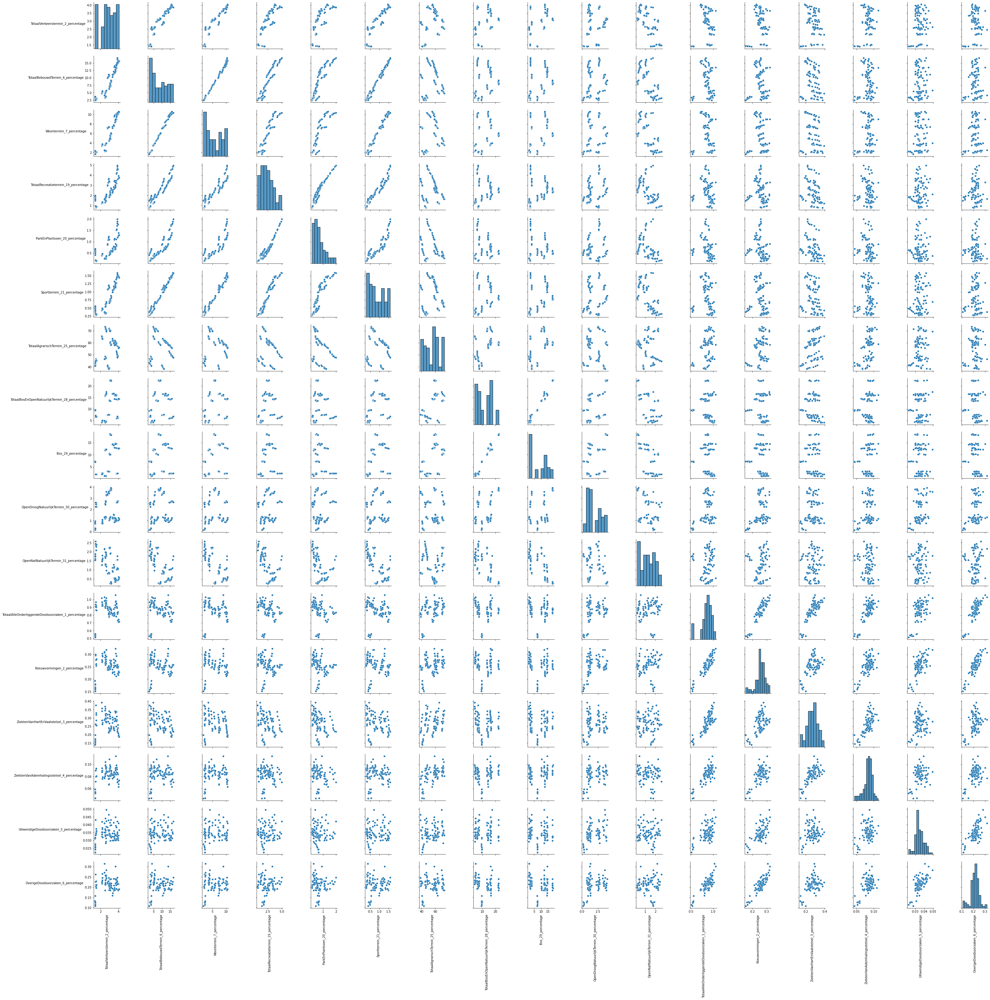

In [51]:
all_pairplot = sns.pairplot(pv_deceased_landuse_perc[cat_all].dropna(how = 'any', axis = 0))
for ax in all_pairplot.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
all_pairplot

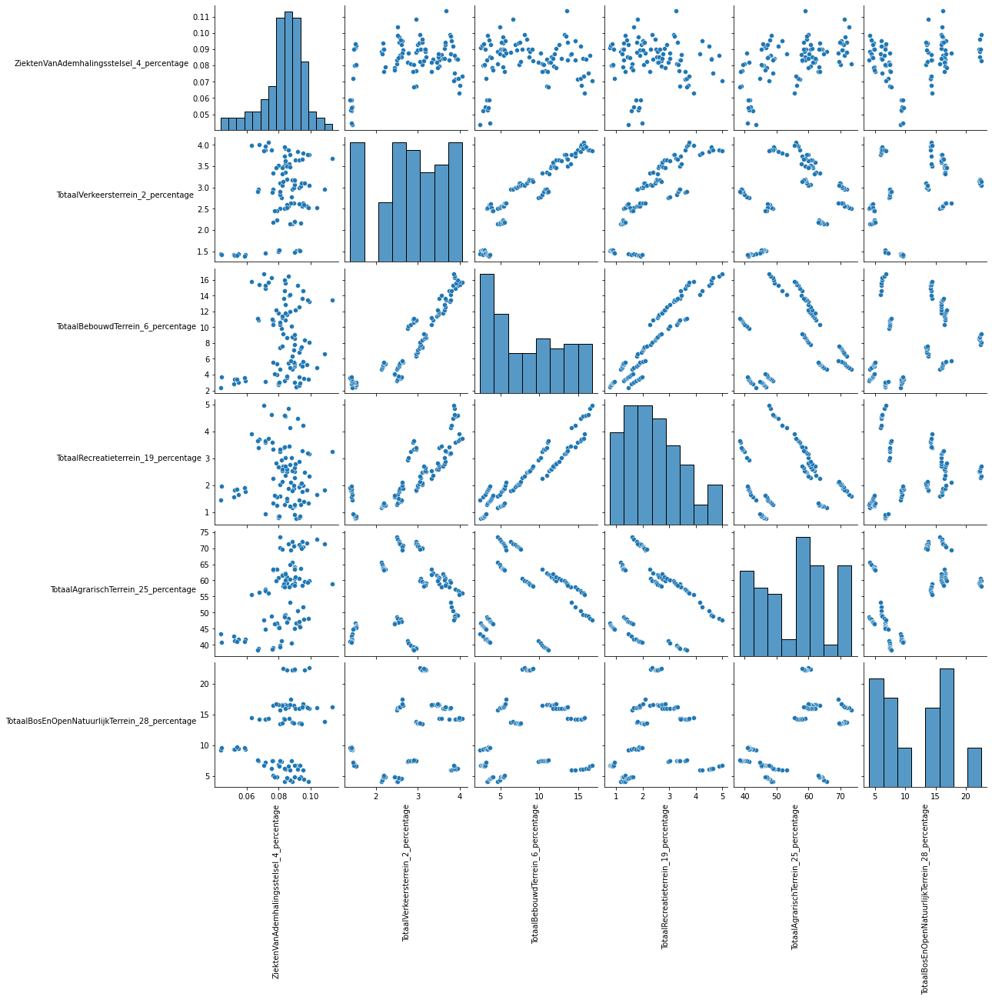

In [52]:
all_select = deceased_select + land_select
select_pairplot = sns.pairplot(pv_deceased_landuse_perc[all_select].dropna(how = 'any', axis = 0))
for ax in select_pairplot.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
select_pairplot

In [53]:
def scatterplot(df, source, title, sub_title, col1, col2, color, field):
    '''
    DOEN
    
    parameters:
        df:
        source:
        title:
        sub_title:
        col1:
        col2:
        color:
        field
    
    return:
        p:
    '''
    p = figure(x_axis_label = str(col1.split('_')[0] + ' percentage'), y_axis_label=str(col2.split('_')[0] + ' percentage'))
    p.add_layout(Title(text=sub_title, text_font_size="8pt", text_font_style="italic"), 'above')
    p.add_layout(Title(text=title, text_font_size="10pt"), 'above')
    list_field_values = list(set(df[field]))
    # Sort so that the legend is sorted
    list_field_values.sort()
    r = p.scatter(col1, col2, fill_alpha=0.9, line_color=None, size=20, source=source, 
              color=factor_cmap(field, color[len(list_field_values)], list_field_values)
             )
    
    #Site I've Used:: https://discourse.bokeh.org/t/representing-data-with-two-categories-by-both-color-and-marker-shape/4122/5
    # we are going to add "dummy" renderers for the legends, restrict auto-ranging
    # to only the "real" renderer above
    p.x_range.renderers = [r]
    p.y_range.renderers = [r]
    # create an invisible renderer to drive color legend
    rc = p.scatter(x=0, y=0, color=color[len(list_field_values)])
    rc.visible = False
    # add a color legend with explicit index, set labels to fit your need
    legend = Legend(items=[
                        LegendItem(label=list_field_values[i], renderers=[rc], index=i) for i, c in enumerate(color[len(list_field_values)])
                    ], location="top_center")
    p.add_layout(legend) 
    
    # Legend
    new_legend = p.legend[0]
    p.add_layout(new_legend, 'right')
    p.legend.orientation = "vertical"
      
    # Hover
    tips = [
        ("Periods", "@Perioden"),
        ('Region', '@RegioS')
    ]
    for name in [col1, col2]:
        new_name = name.split('_')[0]
        tips.append( (new_name, f'@{name} %') )
        
    p.add_tools(HoverTool( tooltips = tips
                            ))
    return p

In [54]:
def data_scatterplot(df, col1, col2, cat_1, cat_2, color):
    '''
    DOEN
    
    parameters:
        df:
        col1:
        col2:
        category:
        color:
    
    return:
        p_end:
    '''
    set_col1 = set(df[col1])
    big_tabs = []
    for name in set_col1:
        filter_df = df[df[col1] == name].copy()
        filter_df = filter_df.sort_values(col2)
        filter_df['Perioden'] = filter_df['Perioden'].astype(str)        
        source_df = ColumnDataSource(data=filter_df)
        tabs = []
        for cat in cat_1:
            tab = []
            for cat_disease in cat_2:
                title = f'{name}: {cat.split("_")[0]} vs {cat_disease.split("_")[0]}'
                sub_title = f'({name} for different {col2})'
                p = scatterplot(filter_df, source_df, title, sub_title, cat, cat_disease, color, col2)
                tab.append(Panel(child=p, title=cat_disease.split('_')[0]))
            p_childchild = Tabs(tabs=tab)
            tabs.append(Panel(child=p_childchild, title=cat.split('_')[0]))
        p_child = Tabs(tabs=tabs)
        big_tabs.append(Panel(child=p_child, title=str(name)))
    p_end = Tabs(tabs=big_tabs)
    return p_end   

In [55]:
scatter_region = data_scatterplot(pv_deceased_landuse_perc, 'RegioS','Perioden', land_select, deceased_select, Set3)

In [56]:
show(scatter_region)

In [57]:
scatter_periods = data_scatterplot(pv_deceased_landuse_perc, 'Perioden','RegioS', land_select, deceased_select, Set3)

In [58]:
show(scatter_periods)

# Map
For this plot I have chosen to depict the last year (2015).
If you are interested in another year you can adjust year_intrest.

In [59]:
def read_grens_data(path):
    '''
    DOEN
    
    parameters:
        path:
    
    return:
        df:
        geojson_data:
        
    
    '''
    with open(path) as json_data:
        geojson_data = json.load(json_data)
    
    #This data frame is created because it makes it easier to view the data compared to geojson_data.
    df = pd.DataFrame()
    for i in geojson_data['features']: 
        df = df.append({'Prov_naam': i['properties']['name'], 'coordinates': i['geometry']['coordinates'][0]}, ignore_index=True)
    return df, geojson_data

In [60]:
#https://www.webuildinternet.com/articles/2015-07-19-geojson-data-of-the-netherlands/provinces.geojson
df_border_pv, geojson_data = read_grens_data(config['path_provinces']) 

In [61]:
def filter_data_map(df, year):
    """
    
    This is a test:
    >>> filter_data_map(pd.DataFrame({"RegioS": ['Groningen (PV)' ,'Gelderland (PV)', 'Friesland (FryslÃ¢n) (PV)', 'Zuid-Holland (PV)', 'Friesland (PV)', 'Utrecht (PV)'], "Perioden": [2013 ,2020, 2013, 2012, 2013, 2000], "test": [2 ,2, 8, 24, 66, 9]}), 2013)
    (                      RegioS  Perioden  test          Prov
    0             Groningen (PV)      2013     2     Groningen
    1            Gelderland (PV)      2020     2    Gelderland
    2  Friesland (FryslÃ¢n) (PV)      2013     8     Friesland
    3          Zuid-Holland (PV)      2012    24  Zuid-Holland
    4             Friesland (PV)      2013    66     Friesland
    5               Utrecht (PV)      2000     9       Utrecht, Empty DataFrame
    Columns: [RegioS, Perioden, test, Prov]
    Index: [], '2013')

    
    """
    # Filter data on 2015 years only. Chosen to only color the year 2015 on the map.
    # Add a new column Prov which is the same as the names in geojson_data
    year_intrest = str(year)
    df['Prov'] = df['RegioS'].str.split(' ').str[0]
    df_year_intrest = df[df['Perioden'] == year_intrest].copy()
    df_year_intrest['Prov'] = df_year_intrest['Prov'].replace('Friesland','Friesland (FryslÃ¢n)')
    return df, df_year_intrest, year_intrest

In [62]:
pv_deceased_landuse_perc, pv_deceased_landuse_perc_year_intrest, year_intrest = filter_data_map(pv_deceased_landuse_perc, 2015)

In [63]:
# Check if the names are the same
print(df_border_pv['Prov_naam'])
print(pv_deceased_landuse_perc_year_intrest['Prov'])

0                  Drenthe
1                Flevoland
2     Friesland (FryslÃ¢n)
3               Gelderland
4                Groningen
5                  Limburg
6            Noord-Brabant
7            Noord-Holland
8               Overijssel
9                  Utrecht
10                 Zeeland
11            Zuid-Holland
Name: Prov_naam, dtype: object
7                Groningen
15    Friesland (FryslÃ¢n)
23                 Drenthe
31              Overijssel
39               Flevoland
47              Gelderland
55                 Utrecht
63           Noord-Holland
71            Zuid-Holland
79                 Zeeland
87           Noord-Brabant
95                 Limburg
Name: Prov, dtype: object


In [64]:
def add_info_geojson(geojson_data, cat_all, df):
    """
    
    
    This is a test:
    >>> add_info_geojson({"type": "FeatureCollection", "features": [ { "type": "Feature", "geometry": { "type": "Point", "coordinates": [102.0, 0.5] }, "properties": { "name": "test1", "prop0": "value0" } }, { "type": "Feature", "geometry": { "type": "LineString", "coordinates": [ [102.0, 0.0], [103.0, 1.0], [104.0, 0.0], [105.0, 1.0] ] }, "properties": { "name": "test2", "prop0": "value0", "prop1": 0.0 } }, { "type": "Feature", "geometry": { "type": "Polygon", "coordinates": [ [ [100.0, 0.0], [101.0, 0.0], [101.0, 1.0], [100.0, 1.0], [100.0, 0.0] ] ] }, "properties": { "name": "test3", "prop0": "value0", "prop1": { "this": "that" } } } ] }, ['name1', 'name2'], pd.DataFrame({"name1": [1 ,4, 4, 8, 6], "name2": [8, 24, 3, 440, -90], "name3": [1, 2, 3, 4 , 5,], "Prov": ['test4', 'test1', 'test2', 'test5', 'test3']}))
    {'type': 'FeatureCollection', 'features': [{'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [102.0, 0.5]}, 'properties': {'name': 'test1', 'prop0': 'value0', 'name1': 4, 'name2': 24}}, {'type': 'Feature', 'geometry': {'type': 'LineString', 'coordinates': [[102.0, 0.0], [103.0, 1.0], [104.0, 0.0], [105.0, 1.0]]}, 'properties': {'name': 'test2', 'prop0': 'value0', 'prop1': 0.0, 'name1': 4, 'name2': 3}}, {'type': 'Feature', 'geometry': {'type': 'Polygon', 'coordinates': [[[100.0, 0.0], [101.0, 0.0], [101.0, 1.0], [100.0, 1.0], [100.0, 0.0]]]}, 'properties': {'name': 'test3', 'prop0': 'value0', 'prop1': {'this': 'that'}, 'name1': 6, 'name2': -90}}]}
    
    """
    # Add the percentages of all categories (landuse and deceased) per province geojson_data.
    # This is to get the numbers when you hoover over a province.
    for cat in cat_all:
        for i in geojson_data['features']:
            prov_name = i['properties']['name']
            i['properties'][cat] = df[df['Prov'] == prov_name][cat].values[0]
    return geojson_data


In [65]:
geojson_data = add_info_geojson(geojson_data, cat_all, pv_deceased_landuse_perc_year_intrest)

In [66]:
def data_map(df, geojson_data, category, year_intrest):
    m_list = []
    for cat in category:
        m = folium.Map(location=[52.0907374, 5.1214201], zoom_start=6, tiles="openstreetmap")
        choropleth = folium.Choropleth(
            geo_data=geojson_data,
            name=cat,
            data=df,
            columns=["Prov", cat],
            key_on="feature.properties.name",
            fill_color="BuPu",
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name=f'{cat.split("_")[0]} Rate (%)',
            highlight=True,
            show=False,
        ).add_to(m)
        choropleth.geojson.add_child(
            folium.features.GeoJsonTooltip(fields=['name', cat],
                                           aliases=['province:', f'value %:'],labels=True)
        )

        title_html = '''
                     <h3 align="center" style="font-size:12px"><b>{}</b></h3>
                     '''.format(f'{cat.split("_")[0]} in {year_intrest}')
        m.get_root().html.add_child(folium.Element(title_html))

        m_list.append(m)
    return m_list
    

In [67]:
m_land = data_map(pv_deceased_landuse_perc_year_intrest, geojson_data, land_select, year_intrest)
m_deceased = data_map(pv_deceased_landuse_perc_year_intrest, geojson_data, deceased_select, year_intrest)

In [68]:
def make_tabs_maps(m_land, m_deceased, select_dec, select_land):
    the_maps = pn.Tabs()
    for index_land, land in enumerate(m_land):
        tabs = pn.Tabs()
        for index_deceased, deceased in enumerate(m_deceased):
            tabs.append((f'{select_dec[index_deceased].split("_")[0]}',pn.Row(land,deceased))) #height=500, width=1000
        the_maps.append((f'{select_land[index_land].split("_")[0]}', tabs))
    return the_maps


In [69]:
the_maps = make_tabs_maps(m_land, m_deceased, deceased_select, land_select)
the_maps

Tabs
    [0] Tabs
        [0] Row
            [0] Folium(Map)
            [1] Folium(Map)
    [1] Tabs
        [0] Row
            [0] Folium(Map)
            [1] Folium(Map)
    [2] Tabs
        [0] Row
            [0] Folium(Map)
            [1] Folium(Map)
    [3] Tabs
        [0] Row
            [0] Folium(Map)
            [1] Folium(Map)
    [4] Tabs
        [0] Row
            [0] Folium(Map)
            [1] Folium(Map)

# Ordinary Least Squares (OLS)

In [70]:
def dict_results(results, land):
    '''
    
    '''
    alpha = 0.05
    dict_res = {f"const params": results.params[0],
                f"const p-value": results.pvalues[0],
                f'const p-value significant': results.pvalues[0]<=alpha,
                f'{land} params': results.params[1],
                f'{land} p-value': results.pvalues[1],
                f'{land} p-value significant': results.pvalues[1]<=alpha,
               }
    return dict_res
    

In [71]:
def ordinary_least_squares(df, land, deceased):
    '''
    '''
    Y = df[deceased]
    X = df[land]
    X = sm.add_constant(X)
    model = sm.OLS(Y, X)
    results_normal = model.fit()
    results_robust = results_normal.get_robustcov_results(cov_type='HC3')
    dict_res_normal = dict_results(results_normal, land)
    dict_res_robust = dict_results(results_robust, land)    
    return model, results_normal, results_robust, dict_res_normal, dict_res_robust   

In [72]:
def make_sub_plots(x, y, df, cat):
    '''
    
    '''
    lmplot_data = sns.lmplot(x=x, y=y,
           hue=cat, col=cat, col_wrap=3, height=3,
           data=df) 
    for ax in lmplot_data.axes.flatten():
        # rotate x axis labels
        ax.set_xlabel(ax.get_xlabel(), rotation = 90)
        # rotate y axis labels
        ax.set_ylabel(ax.get_ylabel(), rotation = 0)
        # set y labels alignment
        ax.yaxis.get_label().set_horizontalalignment('right')
    return implot_data

In [73]:
def OLS_seaborn(x, y, df): 
    '''
    '''
    plt.ioff
    whole_data = plt.figure(figsize=(8, 6))
    sns.regplot(x=x, y=y, data=df)
    plt.title(f'linear regression model: {x.split("_")[0]}-{y.split("_")[0]}')
    plt.close(whole_data)
    return whole_data   

In [74]:
def OLS_bokeh(df, land, deceased,normal, robust):
    '''
    
    '''
    
    x_normal = np.linspace(0,30,300)
    y_normal = normal.params[0] + normal.params[1] * x_normal
    
    x_robust = np.linspace(0,30,300)
    y_robust = robust.params[0] + robust.params[1] * x_robust
    
    source = ColumnDataSource(df)
    pig = figure(x_range=(min(df[land])*1.1, max(df[land])*1.1), y_range=(min(df[deceased])*1.1, max(df[deceased])*1.1))
    pig.circle(x=land, y=deceased, source=source)
    pig.line(x_normal, y_normal, color='red', legend_label='normal')
    pig.line(x_robust, y_robust, color='green', legend_label='robust')
    pig.add_layout(Title(text='bokeh', text_font_size="8pt", text_font_style="italic"), 'above')
    pig.add_layout(Title(text=f'OLS: {land.split("_")[0]}-{deceased.split("_")[0]}', text_font_size="10pt"), 'above')
     
    return pig

In [75]:
deceased_tab = pn.Tabs()
for deceased in deceased_select:
    land_tab = pn.Tabs()
    for land in land_select:
        model, results_normal, results_robust, dict_res_normal, dict_res_robust = ordinary_least_squares(pv_deceased_landuse_perc, land, deceased)
        bokeh_ols = OLS_bokeh(pv_deceased_landuse_perc, land, deceased, results_normal, results_robust)
        seaborn_ols = OLS_seaborn(land, deceased, pv_deceased_landuse_perc)
        tabs = pn.Tabs(('summary results normaal', results_normal.summary()),
                      ('p-value sig normal', dict_res_normal),
                      ('summary results robust', results_robust.summary()),
                      ('p-value sig normal', dict_res_robust),
                      ('seaborn OLS',seaborn_ols),
                      ('bokeh OLS',bokeh_ols))            
        land_tab.append((f'{land.split("_")[0]}', tabs))
    deceased_tab.append((f'{deceased.split("_")[0]}', land_tab))

Tabs
    [0] Tabs
        [0] Tabs
            [0] HTML(Summary, name='summary results normaal')
            [1] Str(dict, name='p-value sig normal')
            [2] HTML(Summary, name='summary results robust')
            [3] Str(dict, name='p-value sig normal')
            [4] Matplotlib(Figure, name='seaborn OLS')
            [5] Bokeh(Figure, name='bokeh OLS')
        [1] Tabs
            [0] HTML(Summary, name='summary results normaal')
            [1] Str(dict, name='p-value sig normal')
            [2] HTML(Summary, name='summary results robust')
            [3] Str(dict, name='p-value sig normal')
            [4] Matplotlib(Figure, name='seaborn OLS')
            [5] Bokeh(Figure, name='bokeh OLS')
        [2] Tabs
            [0] HTML(Summary, name='summary results normaal')
            [1] Str(dict, name='p-value sig normal')
            [2] HTML(Summary, name='summary results robust')
            [3] Str(dict, name='p-value sig normal')
            [4] Matplotlib(Figure, name='seaborn OLS')
            [5] Bokeh(Figure, name='bokeh OLS')
        [3] Tabs
            [0] HTML(Summary, name='summary results normaal')
            [1] Str(dict, name='p-value sig normal')
            [2] HTML(Summary, name='summary results robust')
            [3] Str(dict, name='p-value sig normal')
            [4] Matplotlib(Figure, name='seaborn OLS')
            [5] Bokeh(Figure, name='bokeh OLS')
        [4] Tabs
            [0] HTML(Summary, name='summary results normaal')
            [1] Str(dict, name='p-value sig normal')
            [2] HTML(Summary, name='summary results robust')
            [3] Str(dict, name='p-value sig normal')
            [4] Matplotlib(Figure, name='seaborn OLS')
            [5] Bokeh(Figure, name='bokeh OLS')
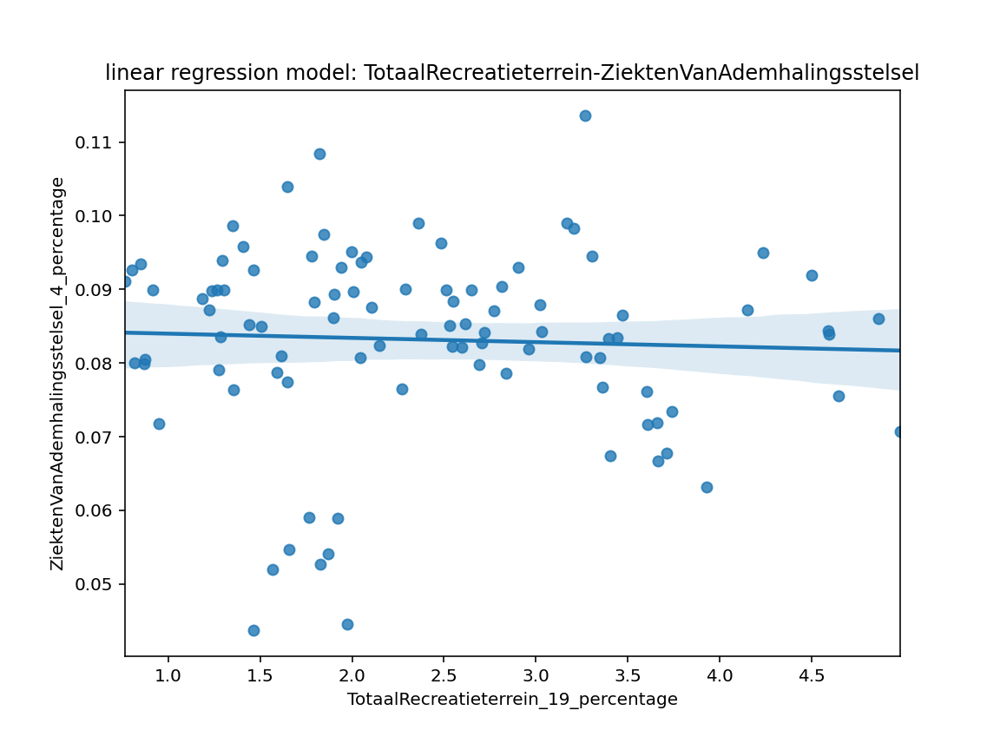
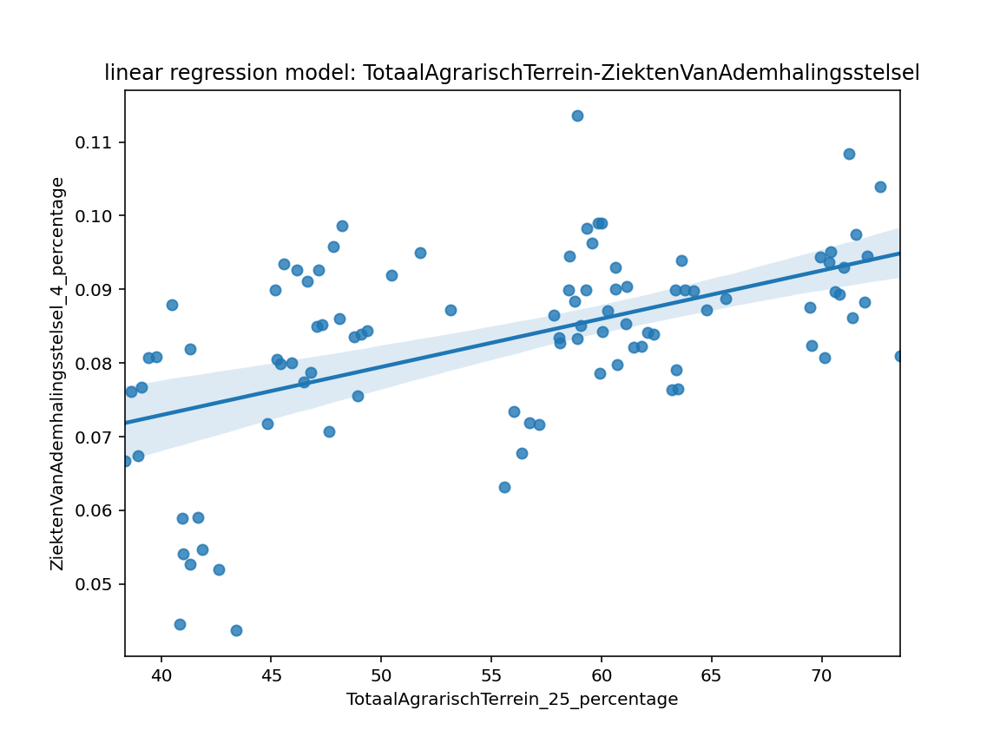
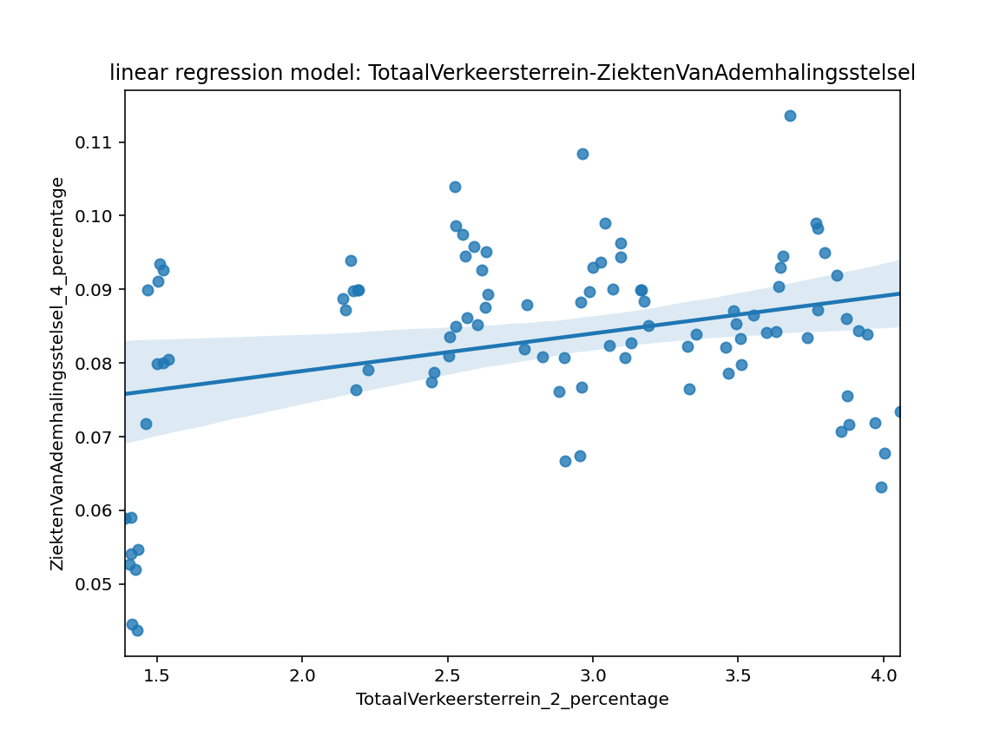
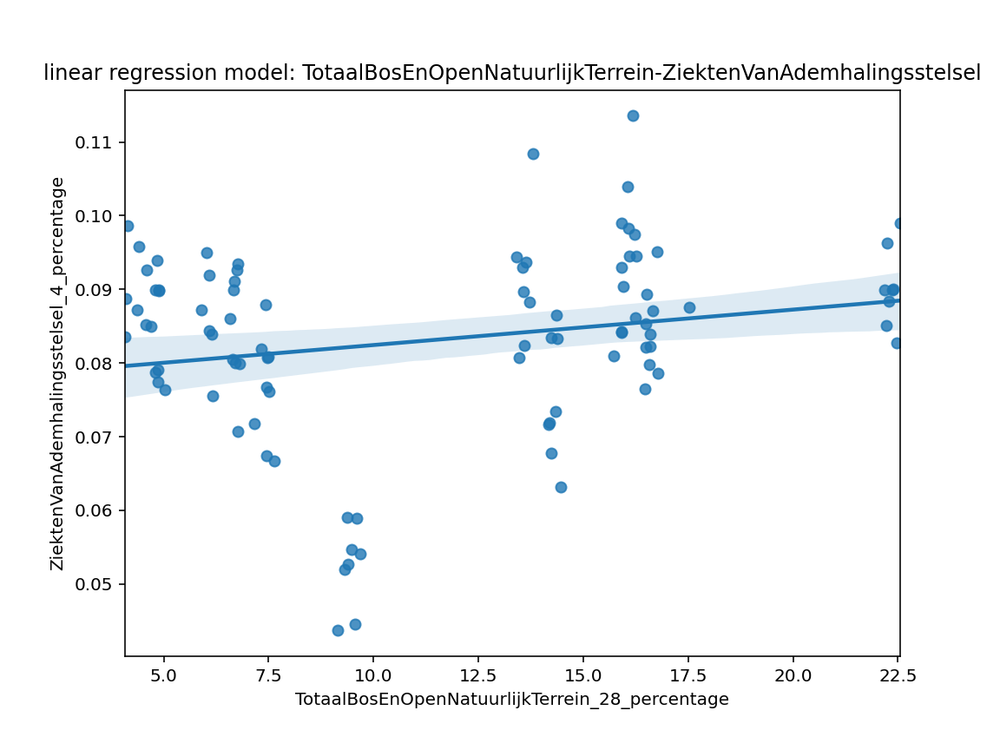
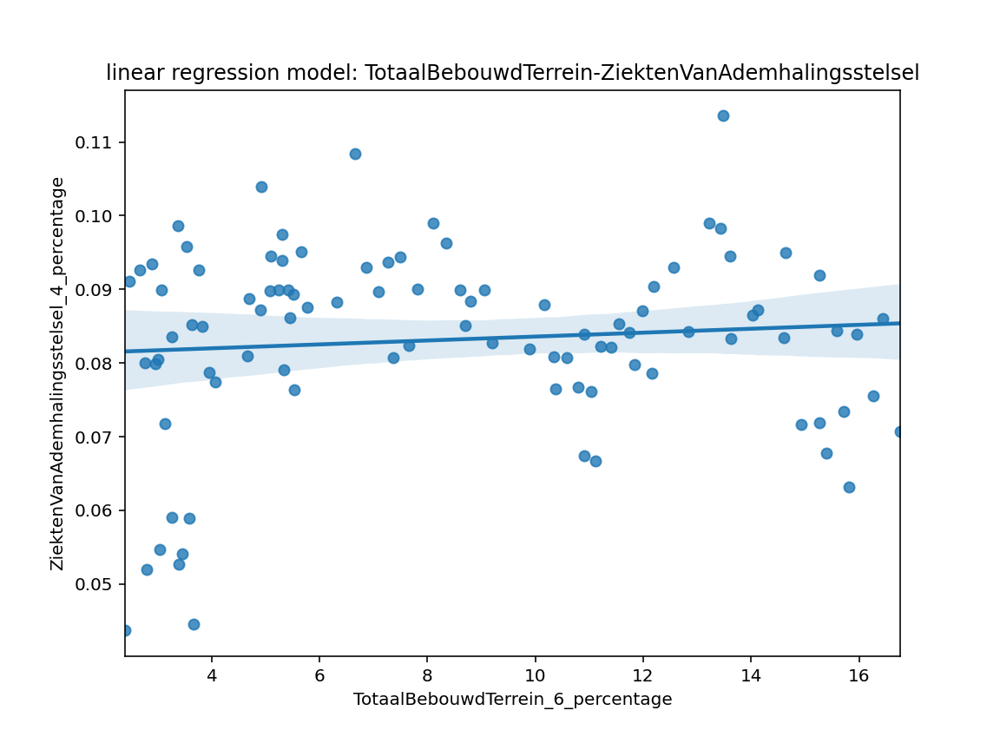

In [76]:
deceased_tab

Here are a few nice plots.
These are only done with x = 'TotaalBosEnOpenNatuurlijkTerrein_28_percentage', and
             y = 'DiseasesOfRespiratory_4_percentage'

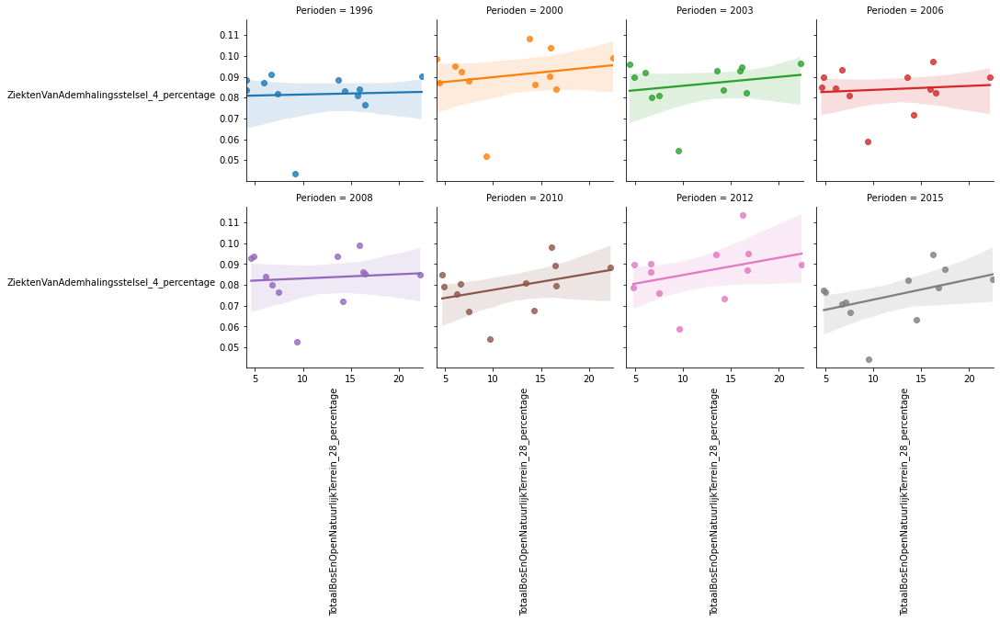

In [77]:
periods_data = sns.lmplot(x='TotaalBosEnOpenNatuurlijkTerrein_28_percentage', 
            y='ZiektenVanAdemhalingsstelsel_4_percentage',
           hue="Perioden", col='Perioden', col_wrap=4, height=3,
           data=pv_deceased_landuse_perc) 
for ax in periods_data.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
periods_data

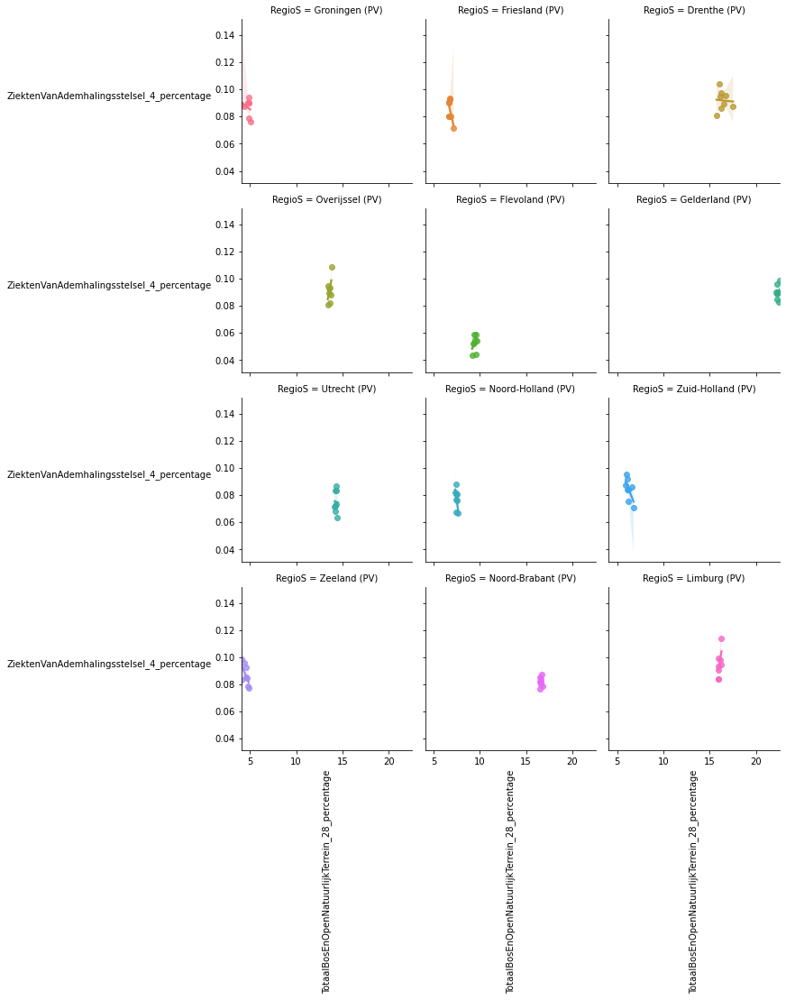

In [78]:
region_data = sns.lmplot(x='TotaalBosEnOpenNatuurlijkTerrein_28_percentage', 
                        y='ZiektenVanAdemhalingsstelsel_4_percentage',
                       hue="RegioS", col='RegioS', col_wrap=3, height=3,
                       data=pv_deceased_landuse_perc) 
for ax in region_data.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
region_data

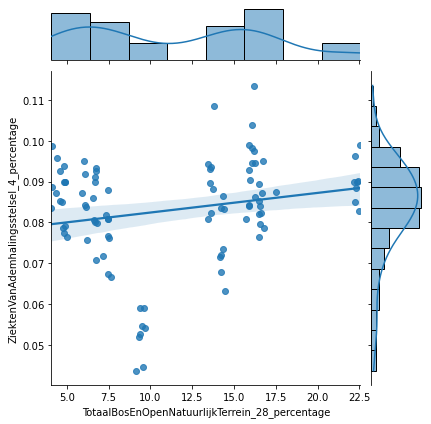

In [79]:
sns.jointplot(x='TotaalBosEnOpenNatuurlijkTerrein_28_percentage', 
            y='ZiektenVanAdemhalingsstelsel_4_percentage', 
            data=pv_deceased_landuse_perc, kind="reg")

## mannwhitneyu

In [80]:
def execute_mann(df, land, deceased):
    stat, p = mannwhitneyu(df[land], df[deceased])
    # interpret
    alpha = 0.05
    print(f'MannWhithney: {land} - {deceased}')    
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    if p > alpha:
        print('Same distribution (fail to reject H0)')
    else:
        print('Different distribution (reject H0)')
    print('-----')
    

In [81]:
for deceased in deceased_select:
    for land in land_select:
        execute_mann(pv_deceased_landuse_perc, land, deceased)

MannWhithney: TotaalVerkeersterrein_2_percentage - ZiektenVanAdemhalingsstelsel_4_percentage
Statistics=0.000, p=0.000
Different distribution (reject H0)
-----
MannWhithney: TotaalBebouwdTerrein_6_percentage - ZiektenVanAdemhalingsstelsel_4_percentage
Statistics=0.000, p=0.000
Different distribution (reject H0)
-----
MannWhithney: TotaalRecreatieterrein_19_percentage - ZiektenVanAdemhalingsstelsel_4_percentage
Statistics=0.000, p=0.000
Different distribution (reject H0)
-----
MannWhithney: TotaalAgrarischTerrein_25_percentage - ZiektenVanAdemhalingsstelsel_4_percentage
Statistics=0.000, p=0.000
Different distribution (reject H0)
-----
MannWhithney: TotaalBosEnOpenNatuurlijkTerrein_28_percentage - ZiektenVanAdemhalingsstelsel_4_percentage
Statistics=0.000, p=0.000
Different distribution (reject H0)
-----


## Doctest

In [82]:
if __name__ == "__main__":
    doctest.testmod(verbose=True)

Trying:
    add_info_geojson({"type": "FeatureCollection", "features": [ { "type": "Feature", "geometry": { "type": "Point", "coordinates": [102.0, 0.5] }, "properties": { "name": "test1", "prop0": "value0" } }, { "type": "Feature", "geometry": { "type": "LineString", "coordinates": [ [102.0, 0.0], [103.0, 1.0], [104.0, 0.0], [105.0, 1.0] ] }, "properties": { "name": "test2", "prop0": "value0", "prop1": 0.0 } }, { "type": "Feature", "geometry": { "type": "Polygon", "coordinates": [ [ [100.0, 0.0], [101.0, 0.0], [101.0, 1.0], [100.0, 1.0], [100.0, 0.0] ] ] }, "properties": { "name": "test3", "prop0": "value0", "prop1": { "this": "that" } } } ] }, ['name1', 'name2'], pd.DataFrame({"name1": [1 ,4, 4, 8, 6], "name2": [8, 24, 3, 440, -90], "name3": [1, 2, 3, 4 , 5,], "Prov": ['test4', 'test1', 'test2', 'test5', 'test3']}))
Expecting:
    {'type': 'FeatureCollection', 'features': [{'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [102.0, 0.5]}, 'properties': {'name': 'test1', 

    __main__.Q_Q_Plot
    __main__.boxplot_fun
    __main__.data_box
    __main__.data_map
    __main__.data_plot_normal_distribution
    __main__.data_scatterplot
    __main__.dict_results
    __main__.execute_mann
    __main__.get_config
    __main__.heatmap
    __main__.make_plot_normal_distribution
    __main__.make_sub_plots
    __main__.make_tabs_maps
    __main__.ordinary_least_squares
    __main__.qq_data
    __main__.read_grens_data
    __main__.scatterplot
    __main__.stracked_and_grouped_bar
6 items passed all tests:
   1 tests in __main__.add_info_geojson
   1 tests in __main__.cal_percentage
   2 tests in __main__.cal_qq_and_histogram
   1 tests in __main__.filter_data
   1 tests in __main__.filter_data_map
   1 tests in __main__.make_bar_stack_group
7 tests in 27 items.
7 passed and 0 failed.
Test passed.
